In [39]:
import geopandas as gpd
import os
import pandas as pd

In [49]:
unidades_federacao = gpd.read_file(r"C:\_Repositorios\CienciaDeDadoseAnaliseGeoestatisticaComGeoprocessamento\BR_UF_2022.shp")

In [51]:
print(r"teste\nteste")

teste\nteste


<Axes: >

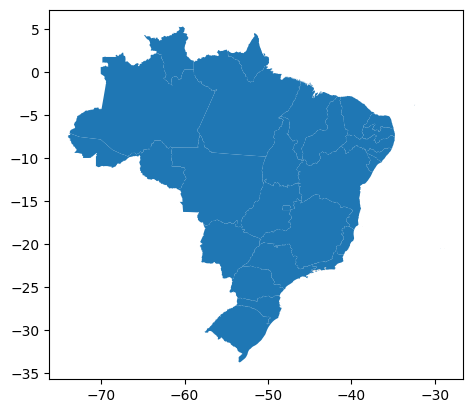

In [52]:
unidades_federacao.plot()

In [53]:
unidades_federacao.columns

Index(['CD_UF', 'NM_UF', 'SIGLA_UF', 'NM_REGIAO', 'AREA_KM2', 'geometry'], dtype='object')

In [54]:
nordeste = unidades_federacao[unidades_federacao["NM_REGIAO"] == "Nordeste\n"]

<Axes: >

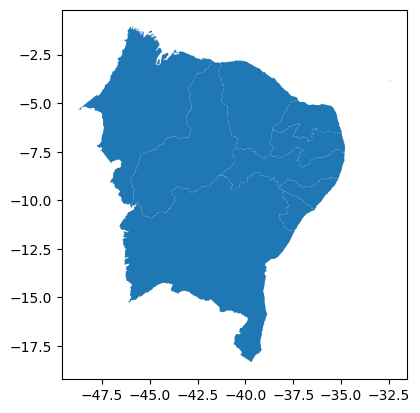

In [55]:
nordeste.plot()

In [57]:
nordeste.to_file("nordeste.shp")

In [60]:
nordesteshp = gpd.read_file(r"C:\_Repositorios\CienciaDeDadoseAnaliseGeoestatisticaComGeoprocessamento\Testes\nordeste.shp")

<Axes: >

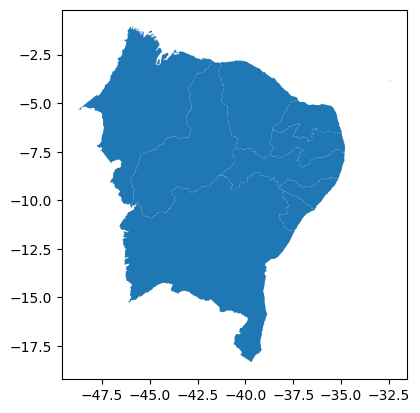

In [61]:
nordesteshp.plot()

In [62]:
nordesteshp["area"] = nordesteshp.area

C:\Users\Lucas\AppData\Local\Temp\ipykernel_28720\1164117503.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nordesteshp["area"] = nordesteshp.area


In [63]:
nordestealbers = nordesteshp.to_crs(9822)

In [64]:
nordestealbers["area"] = nordestealbers.area

In [65]:
nordestealbers.head()

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,area,geometry
0,21,Maranhão,MA,Nordeste\n,329651.496,6.091219e+11,"MULTIPOLYGON (((-4880471.432 -2302104.859, -48..."
1,22,Piauí,PI,Nordeste\n,251755.481,4.953087e+11,"POLYGON ((-4708997.549 -2618848.325, -4707902...."
2,23,Ceará,CE,Nordeste\n,148894.447,2.748890e+11,"POLYGON ((-4173941.23 -3063124.883, -4173912.0..."
3,24,Rio Grande do Norte,RN,Nordeste\n,52809.599,9.937539e+10,"MULTIPOLYGON (((-3907282.554 -3434504.172, -39..."
4,25,Paraíba,PB,Nordeste\n,56467.242,1.100383e+11,"MULTIPOLYGON (((-3944155.705 -3651661.476, -39..."


<Axes: >

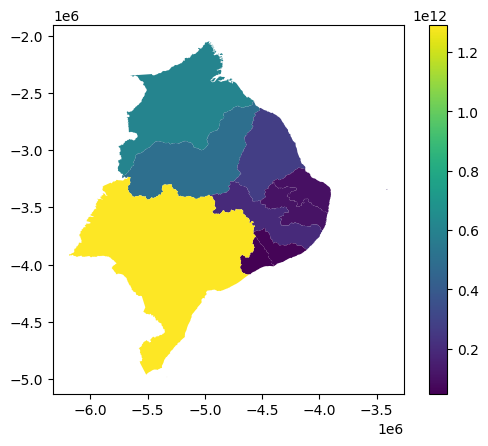

In [66]:
nordestealbers.plot("area", legend=True)

In [71]:
import folium 
import matplotlib as mpl
import mapclassify as mc

nordestealbers.explore("area", legend=False)

In [72]:
nordestealbers['centroid'] = nordestealbers.centroid

In [73]:
nordestealbers.head()

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,area,geometry,centroid
0,21,Maranhão,MA,Nordeste\n,329651.496,6.091219e+11,"MULTIPOLYGON (((-4880471.432 -2302104.859, -48...",POINT (-5203157.309 -2612718.895)
1,22,Piauí,PI,Nordeste\n,251755.481,4.953087e+11,"POLYGON ((-4708997.549 -2618848.325, -4707902....",POINT (-5089658.993 -3095936.288)
2,23,Ceará,CE,Nordeste\n,148894.447,2.748890e+11,"POLYGON ((-4173941.23 -3063124.883, -4173912.0...",POINT (-4457909.572 -3042702.28)
3,24,Rio Grande do Norte,RN,Nordeste\n,52809.599,9.937539e+10,"MULTIPOLYGON (((-3907282.554 -3434504.172, -39...",POINT (-4113506.017 -3342543.295)
4,25,Paraíba,PB,Nordeste\n,56467.242,1.100383e+11,"MULTIPOLYGON (((-3944155.705 -3651661.476, -39...",POINT (-4222839.035 -3506545.22)


<Axes: >

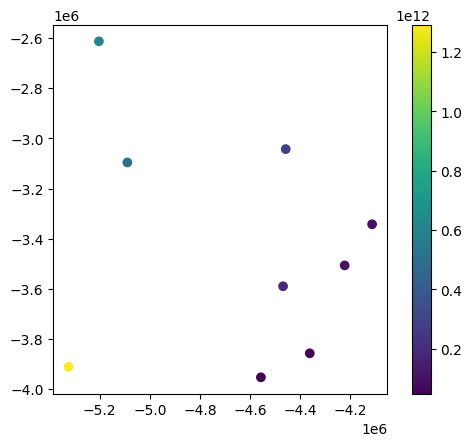

In [75]:
nordestealbers = nordestealbers.set_geometry("centroid")
nordestealbers.plot("area", legend=True)

<Axes: >

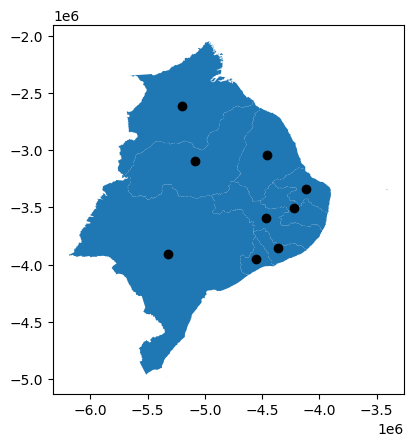

In [77]:
ax = nordestealbers["geometry"].plot()
nordestealbers["centroid"].plot(ax=ax, color="black")

In [93]:
sergipe = nordestealbers[nordestealbers["NM_UF"] == "Sergipe"]

EPSG:9822


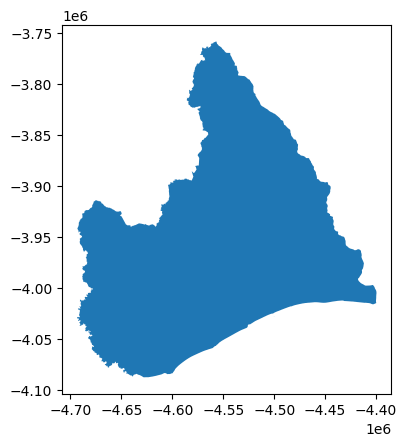

In [95]:
sergipe.plot()
print(sergipe.crs)

In [96]:
sergipe = sergipe.to_crs(4326)

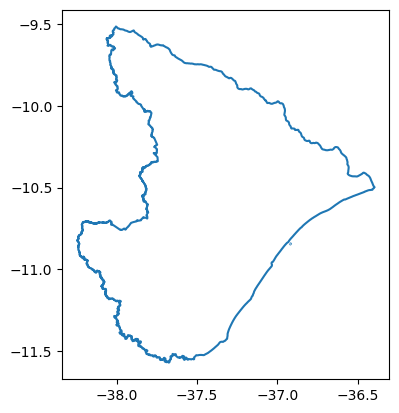

In [103]:
sergipe.boundary.plot();

In [107]:
mun_sergipe = gpd.read_file(r"C:\_Repositorios\CienciaDeDadoseAnaliseGeoestatisticaComGeoprocessamento\Testes\SE_Municipios_2022.shp")
pop_sergipe = pd.read_csv(r"C:\_Repositorios\CienciaDeDadoseAnaliseGeoestatisticaComGeoprocessamento\Testes\popsergipe.csv")

In [116]:
mun_sergipe.head()
pop_sergipe.head()
pop_sergipe.rename(columns={'Município': 'NM_MUN'}, inplace=True)
pop_sergipe.head()


,NM_MUN,Gentílico,População (Último Censo)
0,Amparo do São Francisco,sergipano/sergipense,2170
1,Aquidabã,sergipano/sergipense,20131
2,Aracaju,sergipano/sergipense,602757
3,Arauá,sergipano/sergipense,10318
4,Areia Branca,sergipano/sergipense,18081


In [113]:
gdf_merged = gpd.GeoDataFrame(pd.merge(pop_sergipe, on="Município", mun_sergipe, on='NM_MUN', how='left'))

SyntaxError: positional argument follows keyword argument (1321785408.py, line 1)

In [117]:
gdf_merged = gpd.GeoDataFrame(pd.merge(pop_sergipe, mun_sergipe, on="NM_MUN", how='left'))

In [118]:
gdf_merged.head()

,NM_MUN,Gentílico,População (Último Censo),CD_MUN,SIGLA_UF,AREA_KM2,geometry
0,Amparo do São Francisco,sergipano/sergipense,2170,2800100,SE,35.683,"POLYGON ((-36.9269 -10.12572, -36.92631 -10.12..."
1,Aquidabã,sergipano/sergipense,20131,2800209,SE,359.543,"POLYGON ((-37.0169 -10.19101, -36.99479 -10.17..."
2,Aracaju,sergipano/sergipense,602757,2800308,SE,182.163,"POLYGON ((-37.03564 -10.95968, -37.03583 -10.9..."
3,Arauá,sergipano/sergipense,10318,2800407,SE,198.967,"MULTIPOLYGON (((-37.65625 -11.34042, -37.65625..."
4,Areia Branca,sergipano/sergipense,18081,2800506,SE,148.134,"POLYGON ((-37.31622 -10.74069, -37.31518 -10.7..."
